In [1]:
# Import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msno
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import umap
from sklearn.model_selection import KFold
import textwrap

In [2]:
# Loading the CSV files
ad_eGeMAPS_feature_set = pd.read_csv('audio_ad_eGeMAPS_files/ad_eGeMAPS_features.csv')
cn_eGeMAPS_feature_set = pd.read_csv('audio_cn_eGeMAPS_files/cn_eGeMAPS_features.csv')
test_eGeMAPS_feature_set = pd.read_csv('audio_test_eGeMAPS_files/test_eGeMAPS_features.csv')
test_truth = pd.read_csv('test_truth.csv')


# ad - stands for data of patients detected with Alzheimer's
# cn - stands for the control group data
# Test set is an additional set of data that contains a collection of ad and cn data

In [3]:
ad_eGeMAPS_feature_set.head()

,start,end,audio file,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,...,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp
0,0 days,0 days 00:03:55.857074830,adrso024,22.836117,0.262548,17.961660,22.913454,25.896833,7.935173,174.19131,...,0.034473,-0.014542,0.163655,1.585821,1.204615,0.733627,1.335316,0.100488,0.248929,-26.253954
1,0 days,0 days 00:03:11.152086168,adrso025,25.950464,0.377482,19.555513,23.233688,31.419218,11.863705,276.19775,...,0.034837,-0.006407,0.069983,0.774302,2.271776,0.213387,0.261583,0.221147,0.338732,-32.320164
2,0 days,0 days 00:01:22.482698413,adrso027,19.768696,0.398335,13.725715,16.492744,24.860962,11.135247,335.64285,...,-0.004356,-0.007412,0.134296,0.727537,4.489747,0.099811,0.124493,0.112874,0.129176,-34.366104
3,0 days,0 days 00:01:02.211678005,adrso028,22.070637,0.463571,13.757698,17.229143,27.134663,13.376965,248.23643,...,0.013304,-0.011718,0.118246,0.482315,3.943980,0.174490,0.210899,0.069385,0.108286,-28.948114
4,0 days,0 days 00:01:21.176575964,adrso031,29.309093,0.360100,15.780171,32.175450,38.107906,22.327736,336.57800,...,-0.015987,-0.001244,0.083634,0.689995,2.601726,0.171469,0.250327,0.208814,0.223623,-35.530070


In [4]:
cn_eGeMAPS_feature_set.head()

,start,end,audio file,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,...,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp
0,0 days,0 days 00:01:18.058911565,adrso002,32.148743,0.195630,29.918198,32.302647,34.484608,4.566410,266.66245,...,0.018041,-0.009352,0.076599,2.498718,1.513209,0.488983,0.465185,0.165140,0.196879,-22.068342
1,0 days,0 days 00:00:33.624376417,adrso003,29.971436,0.210694,27.276344,29.303750,32.647003,5.370659,281.85820,...,0.014162,-0.011021,0.103602,2.856293,1.818182,0.387377,0.322785,0.167843,0.349360,-19.553001
2,0 days,0 days 00:01:01.765578231,adrso005,28.708685,0.202150,26.831608,29.339455,31.838795,5.007187,369.29947,...,0.005705,-0.005474,0.191949,1.878543,1.993840,0.407073,0.421165,0.086990,0.122362,-26.684572
3,0 days,0 days 00:00:26.162335601,adrso007,28.454863,0.273630,25.374147,27.646920,30.275562,4.901415,285.29285,...,0.019908,-0.006195,0.164116,2.944551,2.338957,0.263934,0.213743,0.151404,0.220641,-21.138330
4,0 days,0 days 00:00:50.926712018,adrso008,32.818066,0.208943,27.047916,34.046913,36.781120,9.733204,235.66933,...,0.015267,-0.012436,0.069859,2.514241,1.514854,0.465974,0.390621,0.202308,0.390549,-21.198547


In [5]:
test_eGeMAPS_feature_set.head()

,start,end,audio file,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,...,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp
0,0 days,0 days 00:01:06.530952381,adrsdt01,26.933651,0.269920,22.011870,25.267350,31.166980,9.155111,271.53003,...,0.003571,-0.002427,0.020502,1.623572,1.098405,0.516849,0.731054,0.458814,0.498676,-22.297499
1,0 days,0 days 00:01:34.005442177,adrsdt02,27.392118,0.320830,21.840721,24.594528,36.107338,14.266617,358.62870,...,-0.001117,-0.007930,0.026394,0.851154,1.341425,0.222857,0.324499,0.498651,0.778048,-22.206453
2,0 days,0 days 00:01:13.116598639,adrsdt03,26.430683,0.283528,21.537598,26.227154,29.220562,7.682964,298.19595,...,0.039783,-0.004290,0.290363,1.805746,3.463855,0.193557,0.312213,0.086714,0.078241,-19.219969
3,0 days,0 days 00:01:38.135555556,adrsdt04,29.138786,0.364721,24.427902,25.229744,27.371542,2.943640,621.91290,...,0.018380,-0.001044,0.067567,0.611496,1.866014,0.275738,0.260786,0.288411,0.497746,-35.200470
4,0 days,0 days 00:00:38.578276644,adrsdt05,26.466581,0.263205,22.766111,25.472515,28.994644,6.228533,303.45227,...,0.018046,-0.007814,0.074368,2.074689,1.221097,0.611915,0.594115,0.202093,0.279730,-18.861200


In [6]:
# Drop start and end columns

ad_eGeMAPS_feature_set.drop(['start','end'],axis=1, inplace=True)
cn_eGeMAPS_feature_set.drop(['start','end'],axis=1,inplace=True)
test_eGeMAPS_feature_set.drop(['start','end'],axis=1,inplace=True)

In [7]:
# Set index column

ad_eGeMAPS_feature_set.set_index('audio file',inplace=True)
cn_eGeMAPS_feature_set.set_index('audio file',inplace=True)
test_eGeMAPS_feature_set.set_index('audio file',inplace=True)
test_truth.set_index('audio file',inplace=True)

test_merged = test_eGeMAPS_feature_set.merge(test_truth, on ='audio file')

In [8]:
ad_eGeMAPS_feature_set.head()

,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,...,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp
audio file,,,,,,,,,,,,,,,,,,,,,
adrso024,22.836117,0.262548,17.961660,22.913454,25.896833,7.935173,174.19131,211.22704,150.88577,222.97878,...,0.034473,-0.014542,0.163655,1.585821,1.204615,0.733627,1.335316,0.100488,0.248929,-26.253954
adrso025,25.950464,0.377482,19.555513,23.233688,31.419218,11.863705,276.19775,456.58658,177.42262,236.37715,...,0.034837,-0.006407,0.069983,0.774302,2.271776,0.213387,0.261583,0.221147,0.338732,-32.320164
adrso027,19.768696,0.398335,13.725715,16.492744,24.860962,11.135247,335.64285,600.02450,167.47725,232.32630,...,-0.004356,-0.007412,0.134296,0.727537,4.489747,0.099811,0.124493,0.112874,0.129176,-34.366104
adrso028,22.070637,0.463571,13.757698,17.229143,27.134663,13.376965,248.23643,358.60715,147.31458,151.09753,...,0.013304,-0.011718,0.118246,0.482315,3.943980,0.174490,0.210899,0.069385,0.108286,-28.948114
adrso031,29.309093,0.360100,15.780171,32.175450,38.107906,22.327736,336.57800,512.88070,136.47410,149.77420,...,-0.015987,-0.001244,0.083634,0.689995,2.601726,0.171469,0.250327,0.208814,0.223623,-35.530070


In [9]:
# Create a column for status - ad or cn
ad_eGeMAPS_feature_set['status'] = 'ad'
cn_eGeMAPS_feature_set['status'] = 'cn'

In [10]:
# Combine the two data sets
combined_data = pd.concat([ad_eGeMAPS_feature_set, cn_eGeMAPS_feature_set,test_merged])
combined_data.shape

# Total 237 subjects and 89 features

(237, 89)

### Checking if data needs to be cleaned

In [11]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 237 entries, adrso024 to adrsdt71
Data columns (total 89 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   F0semitoneFrom27.5Hz_sma3nz_amean               237 non-null    float64
 1   F0semitoneFrom27.5Hz_sma3nz_stddevNorm          237 non-null    float64
 2   F0semitoneFrom27.5Hz_sma3nz_percentile20.0      237 non-null    float64
 3   F0semitoneFrom27.5Hz_sma3nz_percentile50.0      237 non-null    float64
 4   F0semitoneFrom27.5Hz_sma3nz_percentile80.0      237 non-null    float64
 5   F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2        237 non-null    float64
 6   F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope     237 non-null    float64
 7   F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope   237 non-null    float64
 8   F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope    237 non-null    float64
 9   F0semitoneFrom27.5Hz_sma3nz_stddevFa

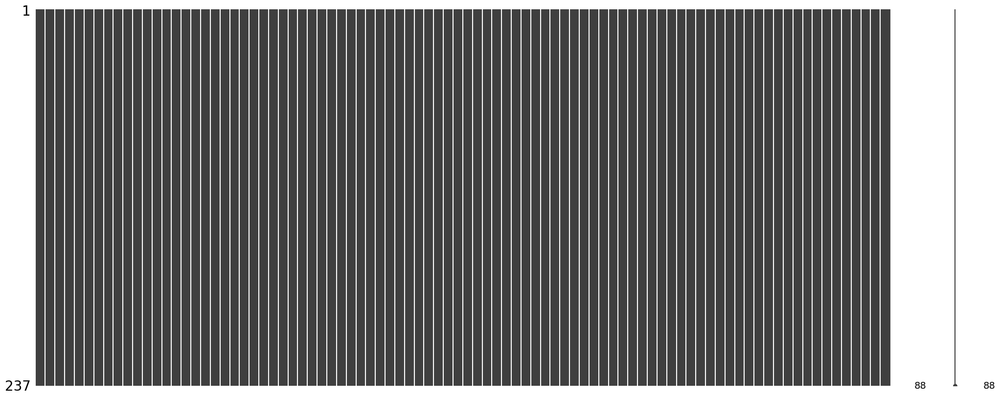

In [12]:
# Checking to see if there are null/Nan/missing values
msno.matrix(combined_data.iloc[:,:-1])
plt.show()

In [13]:
# Final check for missing values

missing = pd.concat([combined_data.isnull().sum(), 100 * combined_data.isnull().mean()], axis=1)
missing.columns = ['count', '%']
missing.sort_values(by=['count','%'],ascending=False)

,count,%
F0semitoneFrom27.5Hz_sma3nz_amean,0,0.0
F0semitoneFrom27.5Hz_sma3nz_stddevNorm,0,0.0
F0semitoneFrom27.5Hz_sma3nz_percentile20.0,0,0.0
F0semitoneFrom27.5Hz_sma3nz_percentile50.0,0,0.0
F0semitoneFrom27.5Hz_sma3nz_percentile80.0,0,0.0
...,...,...
StddevVoicedSegmentLengthSec,0,0.0
MeanUnvoicedSegmentLength,0,0.0
StddevUnvoicedSegmentLength,0,0.0
equivalentSoundLevel_dBp,0,0.0


Looks like there are no missing/Nan values

In [14]:
combined_data.describe().T

# Too many features to get an idea about summary statistics

,count,mean,std,min,25%,50%,75%,max
F0semitoneFrom27.5Hz_sma3nz_amean,237.0,28.748816,4.445856,15.725306,26.467016,29.004204,32.112330,37.184845
F0semitoneFrom27.5Hz_sma3nz_stddevNorm,237.0,0.290955,0.080005,0.132522,0.240163,0.276877,0.330517,0.613510
F0semitoneFrom27.5Hz_sma3nz_percentile20.0,237.0,22.797898,5.430951,13.338406,18.579866,23.323341,27.099632,34.375470
F0semitoneFrom27.5Hz_sma3nz_percentile50.0,237.0,28.149011,5.442558,13.618164,25.215237,29.441784,32.207054,38.308800
F0semitoneFrom27.5Hz_sma3nz_percentile80.0,237.0,33.828138,5.454694,14.278179,30.988274,34.484608,37.414616,50.736600
...,...,...,...,...,...,...,...,...
MeanVoicedSegmentLengthSec,237.0,0.441565,0.772465,0.076457,0.227390,0.302131,0.408831,9.666364
StddevVoicedSegmentLengthSec,237.0,0.543511,1.025350,0.091773,0.278905,0.349572,0.445179,11.826760
MeanUnvoicedSegmentLength,237.0,0.276146,0.205525,0.032500,0.120526,0.221147,0.375038,1.353939
StddevUnvoicedSegmentLength,237.0,0.469777,0.425210,0.016394,0.160933,0.347599,0.654263,2.304313


### Let's look at the distributions of each feature

The purpose here is to see if there are outliers or unusual data distributions

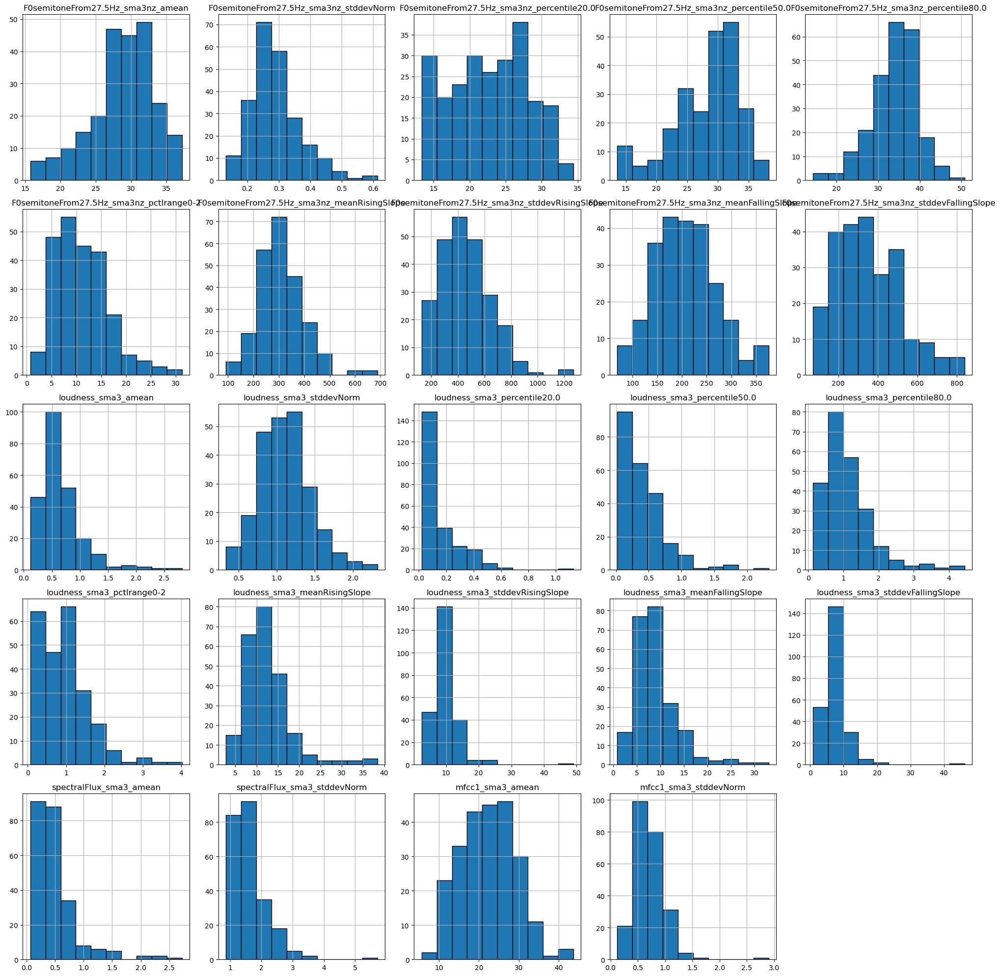

In [15]:
combined_data.iloc[:,:24].hist(figsize=(20,20),ec="k")
plt.subplots_adjust(hspace=0.5)
plt.tight_layout()

Notice some features related to standard devations of certain metrics have outliers in the data distribution. For example, loudness_sma3_stdevRisingSlope. Similar graphs for other features can be made using the following commands.

In [16]:
# combined_data.iloc[:,24:48].hist(figsize=(20,20),ec="k")
# plt.subplots_adjust(hspace=0.5)
# plt.tight_layout()

In [17]:
# combined_data.iloc[:,48:72].hist(figsize=(20,20),ec="k")
# plt.subplots_adjust(hspace=0.5)
# plt.tight_layout()

In [18]:
# combined_data.iloc[:,72:90].hist(figsize=(20,20),ec="k")
# plt.subplots_adjust(hspace=0.5)
# plt.tight_layout()

Overall, some features have considerable outliers. However, we decided to keep all features.

### Principle Component Analysis

In [19]:
# Scale the data

combined_data_scale = scale(combined_data.iloc[:,:-1])

In [20]:
ad_pca = PCA().fit(combined_data_scale)

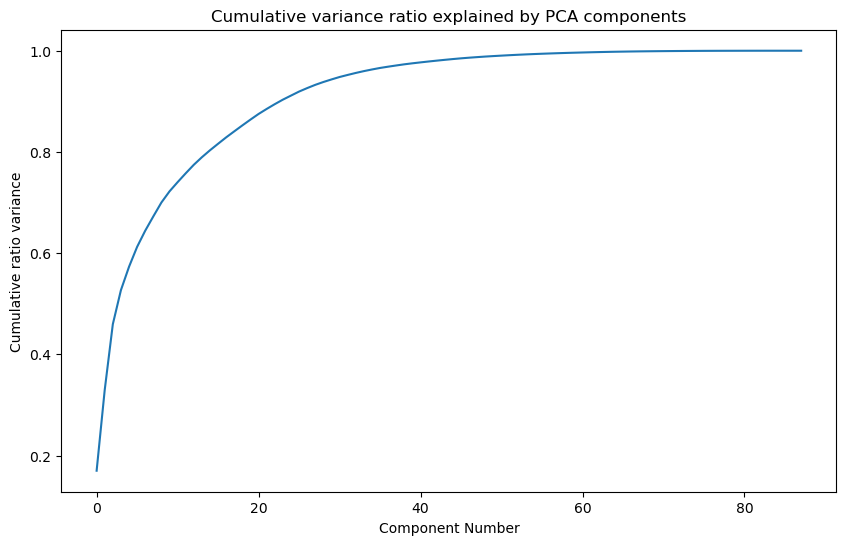

In [21]:
plt.subplots(figsize=(10, 6))
plt.plot(ad_pca.explained_variance_ratio_.cumsum())
plt.xlabel('Component Number')
plt.ylabel('Cumulative ratio variance')
#plt.xticks(np.arange(0,100,1))
plt.title('Cumulative variance ratio explained by PCA components')
plt.show()

In [22]:
# Cumilative sum of explained variance ratio
ad_pca.explained_variance_ratio_.cumsum()

array([0.17008573, 0.32983654, 0.459592  , 0.52691584, 0.57307921,
       0.61245781, 0.6443556 , 0.67263812, 0.70011008, 0.72210057,
       0.74028594, 0.75777093, 0.77462606, 0.78957271, 0.80331666,
       0.81619157, 0.82886709, 0.84074591, 0.85248493, 0.86394537,
       0.87506752, 0.88498461, 0.89444256, 0.9033418 , 0.91134397,
       0.91930833, 0.92616234, 0.93258226, 0.9381858 , 0.94325974,
       0.9480647 , 0.95216462, 0.95609434, 0.95970149, 0.9629394 ,
       0.96596182, 0.9684837 , 0.97087157, 0.97315979, 0.97513634,
       0.97696596, 0.97873647, 0.9804064 , 0.98200828, 0.98354161,
       0.98496893, 0.98622895, 0.98737723, 0.98846837, 0.98941548,
       0.99031441, 0.99118664, 0.99198794, 0.99273272, 0.99341093,
       0.99402898, 0.99459876, 0.99513932, 0.99563987, 0.99609614,
       0.99652354, 0.9969299 , 0.9973135 , 0.99765645, 0.99797557,
       0.99823552, 0.99848729, 0.99870365, 0.99888752, 0.99905103,
       0.99919775, 0.99933484, 0.99945199, 0.99955656, 0.99964

Notice we need about 9 principle componenets to capture 70% of variance. Probably PCA is not a good option here for feature selection.

#### Let's look at correlation between the features to see if there's multicolinearity.

In [23]:
combined_data.columns

Index(['F0semitoneFrom27.5Hz_sma3nz_amean',
       'F0semitoneFrom27.5Hz_sma3nz_stddevNorm',
       'F0semitoneFrom27.5Hz_sma3nz_percentile20.0',
       'F0semitoneFrom27.5Hz_sma3nz_percentile50.0',
       'F0semitoneFrom27.5Hz_sma3nz_percentile80.0',
       'F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2',
       'F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope',
       'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope',
       'F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope',
       'F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope', 'loudness_sma3_amean',
       'loudness_sma3_stddevNorm', 'loudness_sma3_percentile20.0',
       'loudness_sma3_percentile50.0', 'loudness_sma3_percentile80.0',
       'loudness_sma3_pctlrange0-2', 'loudness_sma3_meanRisingSlope',
       'loudness_sma3_stddevRisingSlope', 'loudness_sma3_meanFallingSlope',
       'loudness_sma3_stddevFallingSlope', 'spectralFlux_sma3_amean',
       'spectralFlux_sma3_stddevNorm', 'mfcc1_sma3_amean',
       'mfcc1_sma3_stddevNorm', 'mfcc2_

Looks like there are "chunks" of data. That is, look at the first 10 feature set. They are related to F0semitone. The first 10 features are just mean, std, perecentiles of F0semitone. Let's investigate each chunk for correlations using heatmaps and pairplots.

In [24]:
#features "chunk" collections

F0_feature_set = ['F0semitoneFrom27.5Hz_sma3nz_amean',
       'F0semitoneFrom27.5Hz_sma3nz_stddevNorm',
       'F0semitoneFrom27.5Hz_sma3nz_percentile20.0',
       'F0semitoneFrom27.5Hz_sma3nz_percentile50.0',
       'F0semitoneFrom27.5Hz_sma3nz_percentile80.0',
       'F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2',
       'F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope',
       'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope',
       'F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope',
       'F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope','status']




loudness_feature_set = ['loudness_sma3_amean',
       'loudness_sma3_stddevNorm', 'loudness_sma3_percentile20.0',
       'loudness_sma3_percentile50.0', 'loudness_sma3_percentile80.0',
       'loudness_sma3_pctlrange0-2', 'loudness_sma3_meanRisingSlope',
       'loudness_sma3_stddevRisingSlope', 'loudness_sma3_meanFallingSlope',
       'loudness_sma3_stddevFallingSlope','status']

spectral_flux_feature_set = ['spectralFlux_sma3_amean',
       'spectralFlux_sma3_stddevNorm','status']

mfcc_feature_set = ['mfcc1_sma3_amean',
       'mfcc1_sma3_stddevNorm', 'mfcc2_sma3_amean', 'mfcc2_sma3_stddevNorm',
       'mfcc3_sma3_amean', 'mfcc3_sma3_stddevNorm', 'mfcc4_sma3_amean',
       'mfcc4_sma3_stddevNorm','mfcc1V_sma3nz_amean',
       'mfcc1V_sma3nz_stddevNorm','mfcc2V_sma3nz_amean',
       'mfcc2V_sma3nz_stddevNorm','mfcc3V_sma3nz_amean',
       'mfcc3V_sma3nz_stddevNorm', 'mfcc4V_sma3nz_amean',
       'mfcc4V_sma3nz_stddevNorm','status']

jitter_shimmer_feature_set = ['jitterLocal_sma3nz_amean',
       'jitterLocal_sma3nz_stddevNorm', 'shimmerLocaldB_sma3nz_amean',
       'shimmerLocaldB_sma3nz_stddevNorm','status']

log_rel_feature_set = ['HNRdBACF_sma3nz_amean',
       'HNRdBACF_sma3nz_stddevNorm', 'logRelF0-H1-H2_sma3nz_amean',
       'logRelF0-H1-H2_sma3nz_stddevNorm', 'logRelF0-H1-A3_sma3nz_amean',
       'logRelF0-H1-A3_sma3nz_stddevNorm','status']

F1_feature_set = ['F1frequency_sma3nz_amean',
       'F1frequency_sma3nz_stddevNorm', 'F1bandwidth_sma3nz_amean',
       'F1bandwidth_sma3nz_stddevNorm', 'F1amplitudeLogRelF0_sma3nz_amean',
       'F1amplitudeLogRelF0_sma3nz_stddevNorm','status']

F2_feature_set = ['F2frequency_sma3nz_amean',
       'F2frequency_sma3nz_stddevNorm', 'F2bandwidth_sma3nz_amean',
       'F2bandwidth_sma3nz_stddevNorm', 'F2amplitudeLogRelF0_sma3nz_amean',
       'F2amplitudeLogRelF0_sma3nz_stddevNorm','status']

F3_feature_set = ['F3frequency_sma3nz_amean',
       'F3frequency_sma3nz_stddevNorm', 'F3bandwidth_sma3nz_amean',
       'F3bandwidth_sma3nz_stddevNorm', 'F3amplitudeLogRelF0_sma3nz_amean',
       'F3amplitudeLogRelF0_sma3nz_stddevNorm','status']

slope_alphaV_feature_set = ['alphaRatioV_sma3nz_amean',
       'alphaRatioV_sma3nz_stddevNorm', 'hammarbergIndexV_sma3nz_amean',
       'hammarbergIndexV_sma3nz_stddevNorm', 'slopeV0-500_sma3nz_amean',
       'slopeV0-500_sma3nz_stddevNorm', 'slopeV500-1500_sma3nz_amean',
       'slopeV500-1500_sma3nz_stddevNorm','spectralFluxV_sma3nz_amean',
       'spectralFluxV_sma3nz_stddevNorm','status']

slope_alphaUV_feature_set = ['alphaRatioUV_sma3nz_amean',
       'hammarbergIndexUV_sma3nz_amean', 'slopeUV0-500_sma3nz_amean',
       'slopeUV500-1500_sma3nz_amean', 'spectralFluxUV_sma3nz_amean','status']


other_features_set = ['loudnessPeaksPerSec', 'VoicedSegmentsPerSec',
       'MeanVoicedSegmentLengthSec', 'StddevVoicedSegmentLengthSec',
       'MeanUnvoicedSegmentLength', 'StddevUnvoicedSegmentLength',
       'equivalentSoundLevel_dBp','status']



In [25]:

def wrap_labels(ax, width):
    label = ax.get_ylabel()[:width] + '\n' + ax.get_ylabel()[width:]
    ax.set_ylabel(label, rotation=90)

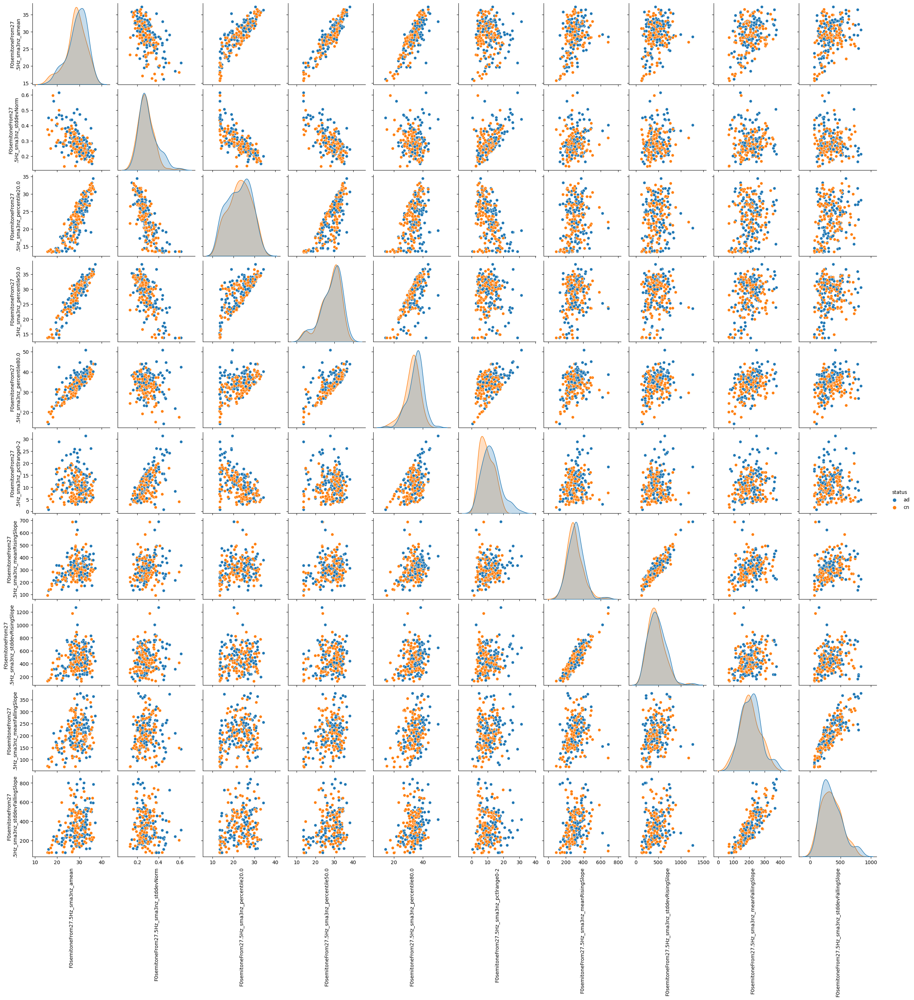

In [26]:
# First chunk pairplot and heatmap

g = sns.pairplot(combined_data[F0_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate and split y axis labels
    wrap_labels(ax,16)


Text(0.5, 1.0, 'Heat map of correlation between F0semitone features')

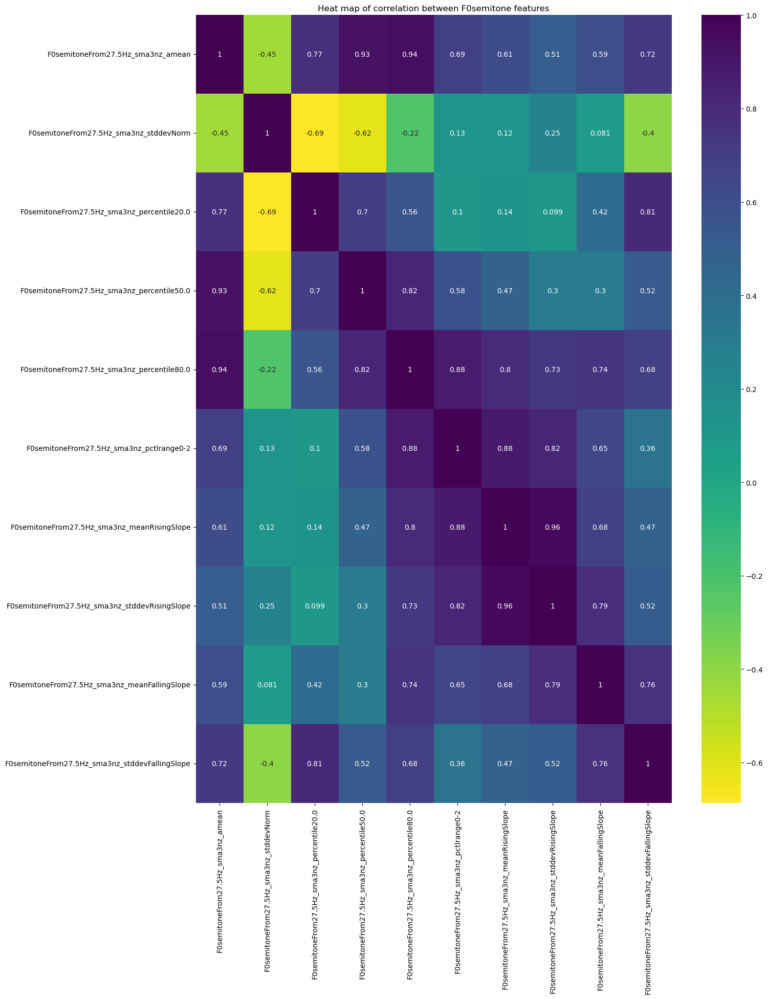

In [27]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data.iloc[:10,:10].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between F0semitone features')

#### Summary - comparing pairplots and the heatmap

Looks like 'F0semitoneFrom27.5Hz_sma3nz_amean' is strongly correlated with it's three percentiles (20,50 and 80).

'F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope' has a strong correlation with it's std feature - same for Falling Slope

Here's the new F0 feature set after drooping some:

In [28]:

F0_new = ['F0semitoneFrom27.5Hz_sma3nz_percentile80.0',
       'F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2',
       'F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope']

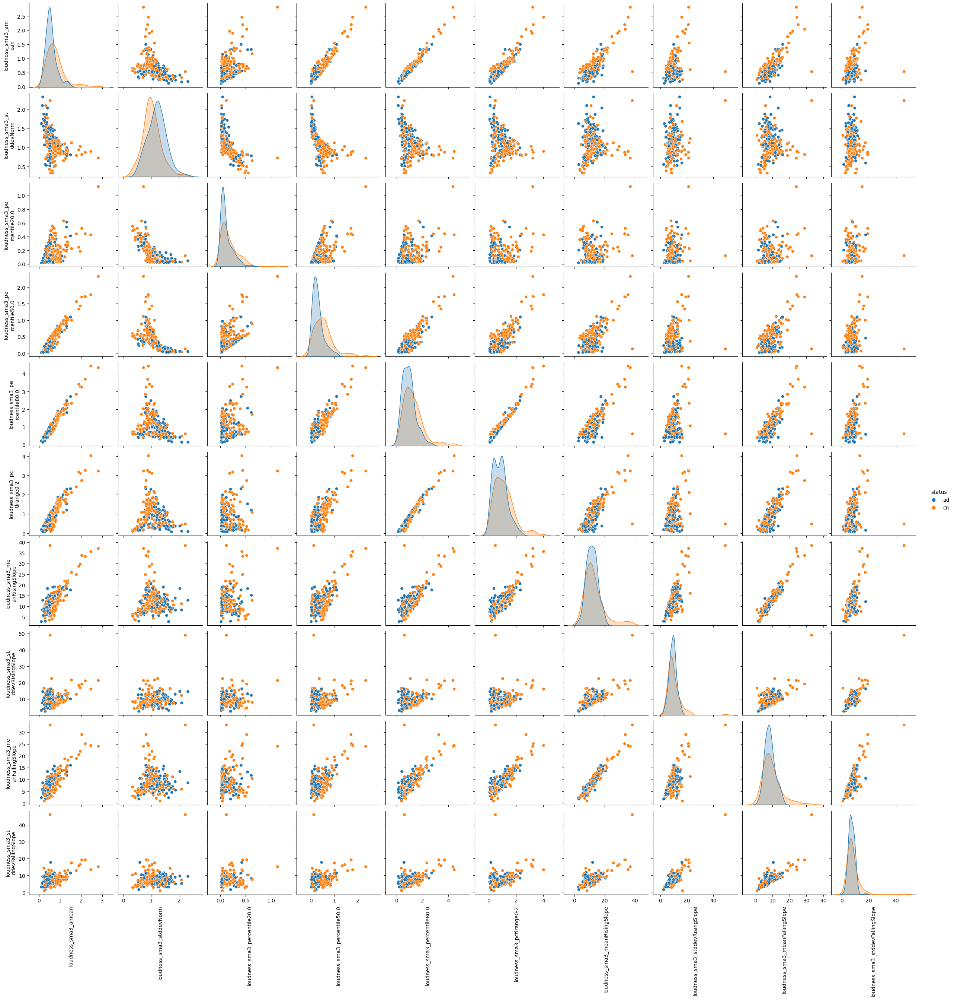

In [29]:
# Loudness feature set - pair plot and the heatmap

g = sns.pairplot(combined_data[loudness_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate and split y axis labels
    wrap_labels(ax,16)

C:\Users\Nadun\AppData\Local\Temp\ipykernel_23528\3882326365.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(combined_data[loudness_feature_set].corr(),cmap='viridis_r',annot=True);


Text(0.5, 1.0, 'Heat map of correlation between loudness features')

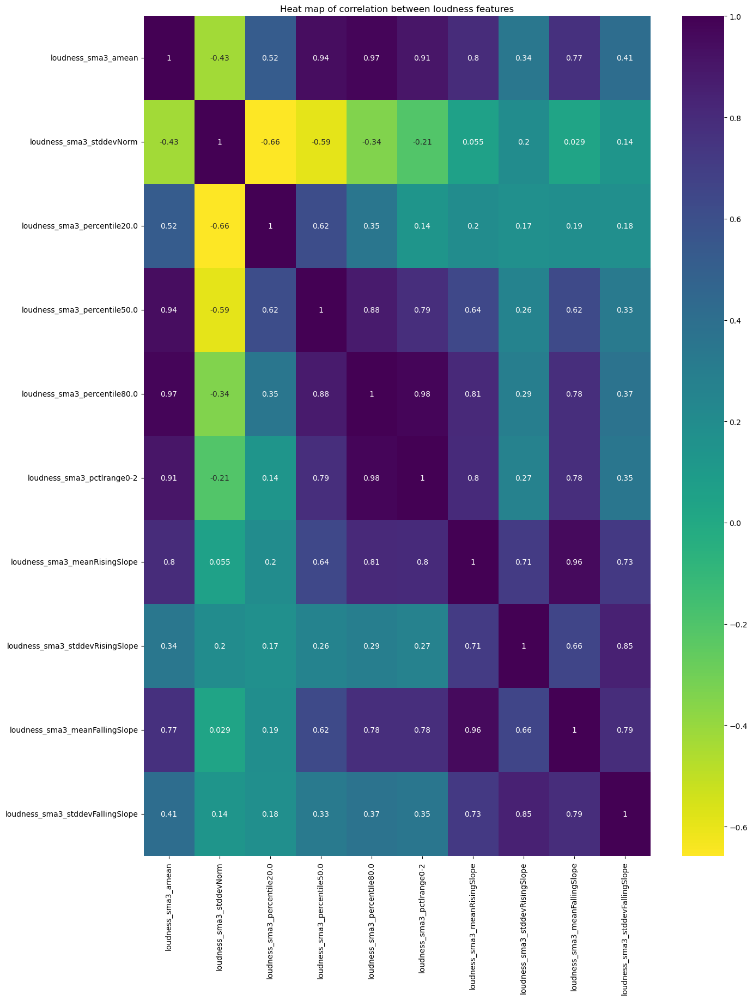

In [30]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[loudness_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between loudness features')

#### Summary - comparing pairplots and the heatmap

Looks like 'loudness_sma3_amean' is strongly correlated with it's three percentiles (20,50 and 80) and the range.

'loudness_sma3_meanRisingSlope' has a strong correlation with falling slope and all std's


Here's the new loudness features:

In [31]:
loudness_new = ['loudness_sma3_amean', 'loudness_sma3_percentile50.0','loudness_sma3_meanRisingSlope',
       'loudness_sma3_stddevRisingSlope', 'loudness_sma3_meanFallingSlope',
       'loudness_sma3_stddevFallingSlope']

# loudness_feature_set = ['loudness_sma3_amean',
#        'loudness_sma3_stddevNorm', 'loudness_sma3_percentile20.0',
#        'loudness_sma3_percentile50.0', 'loudness_sma3_percentile80.0',
#        'loudness_sma3_pctlrange0-2', 'loudness_sma3_meanRisingSlope',
#        'loudness_sma3_stddevRisingSlope', 'loudness_sma3_meanFallingSlope',
#        'loudness_sma3_stddevFallingSlope','status']


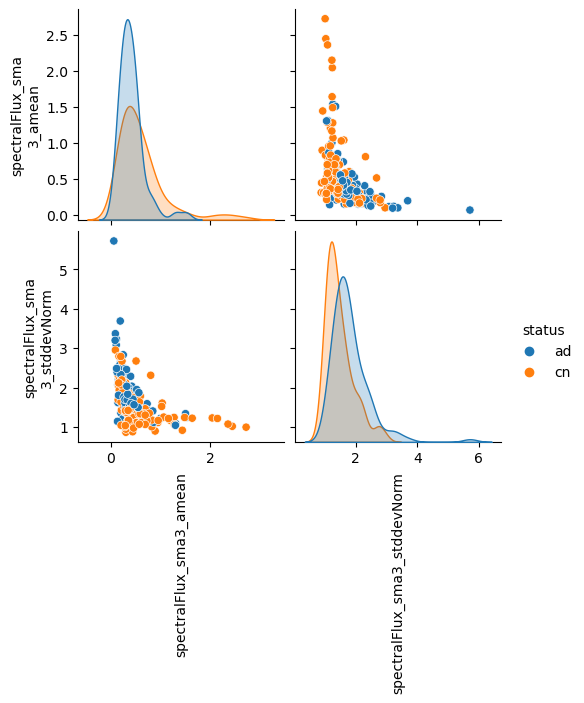

In [32]:
g = sns.pairplot(combined_data[spectral_flux_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate and split y axis labels
    wrap_labels(ax,16)

In [33]:
# Looks like we can keep both these features
spectral_flux_new = ['spectralFlux_sma3_amean',
       'spectralFlux_sma3_stddevNorm']

In [34]:
# g = sns.pairplot(combined_data[mfcc_feature_set],hue='status')

# for ax in g.axes.flatten():
#     # rotate x axis labels
#     ax.set_xlabel(ax.get_xlabel(), rotation = 90)
#     # rotate and split y axis labels
#     wrap_labels(ax,16)

C:\Users\Nadun\AppData\Local\Temp\ipykernel_23528\3752984614.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(combined_data[mfcc_feature_set].corr(),cmap='viridis_r',annot=True);


Text(0.5, 1.0, 'Heat map of correlation between mfcc features')

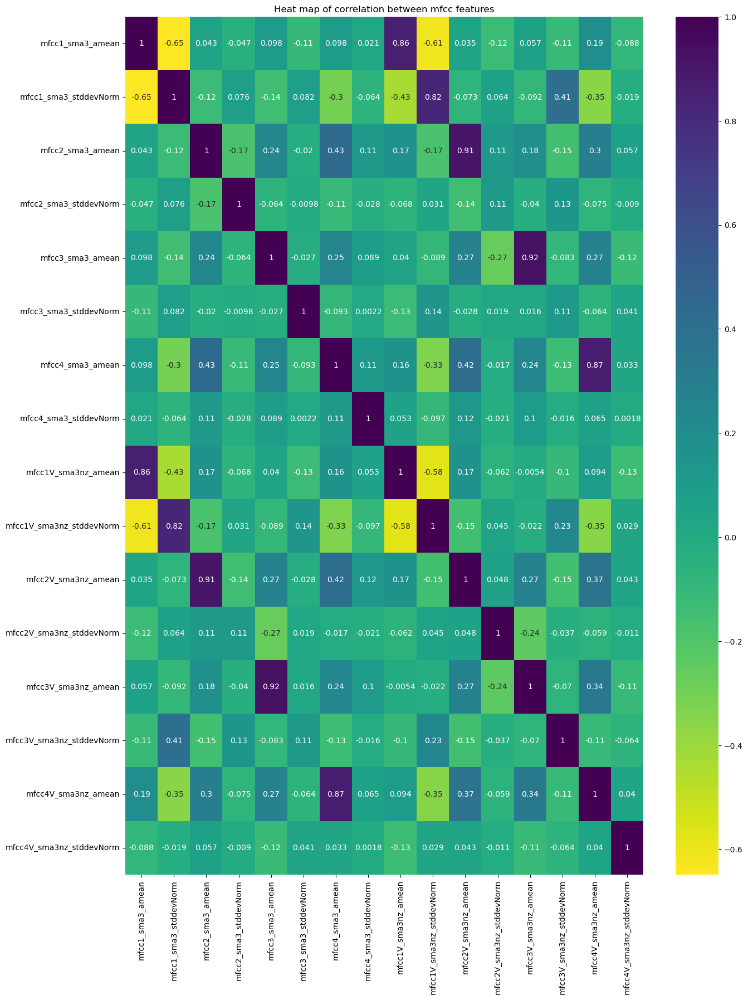

In [35]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[mfcc_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between mfcc features')

### Summary

Looks like 'mfcc1_sma3_amean' and 'mfcc1_sma3_stddevNorm' is highly correlated with 'mfcc1V_sma3nz_amean' and 'mfcc1V_sma3nz_stddevNorm'.
 Same observations can be made with mfcc2 (mean) and mfcc3/4 (mean).



In [36]:
mfcc_new = ['mfcc1_sma3_stddevNorm','mfcc2_sma3_stddevNorm', 'mfcc3_sma3_stddevNorm','mfcc4_sma3_stddevNorm','mfcc2V_sma3nz_stddevNorm','mfcc3V_sma3nz_stddevNorm']

# mfcc_feature_set = ['mfcc1_sma3_amean',
#        'mfcc1_sma3_stddevNorm', 'mfcc2_sma3_amean', 'mfcc2_sma3_stddevNorm',
#        'mfcc3_sma3_amean', 'mfcc3_sma3_stddevNorm', 'mfcc4_sma3_amean',
#        'mfcc4_sma3_stddevNorm','mfcc1V_sma3nz_amean',
#        'mfcc1V_sma3nz_stddevNorm','mfcc2V_sma3nz_amean',
#        'mfcc2V_sma3nz_stddevNorm','mfcc3V_sma3nz_amean',
#        'mfcc3V_sma3nz_stddevNorm', 'mfcc4V_sma3nz_amean',
#        'mfcc4V_sma3nz_stddevNorm','status']

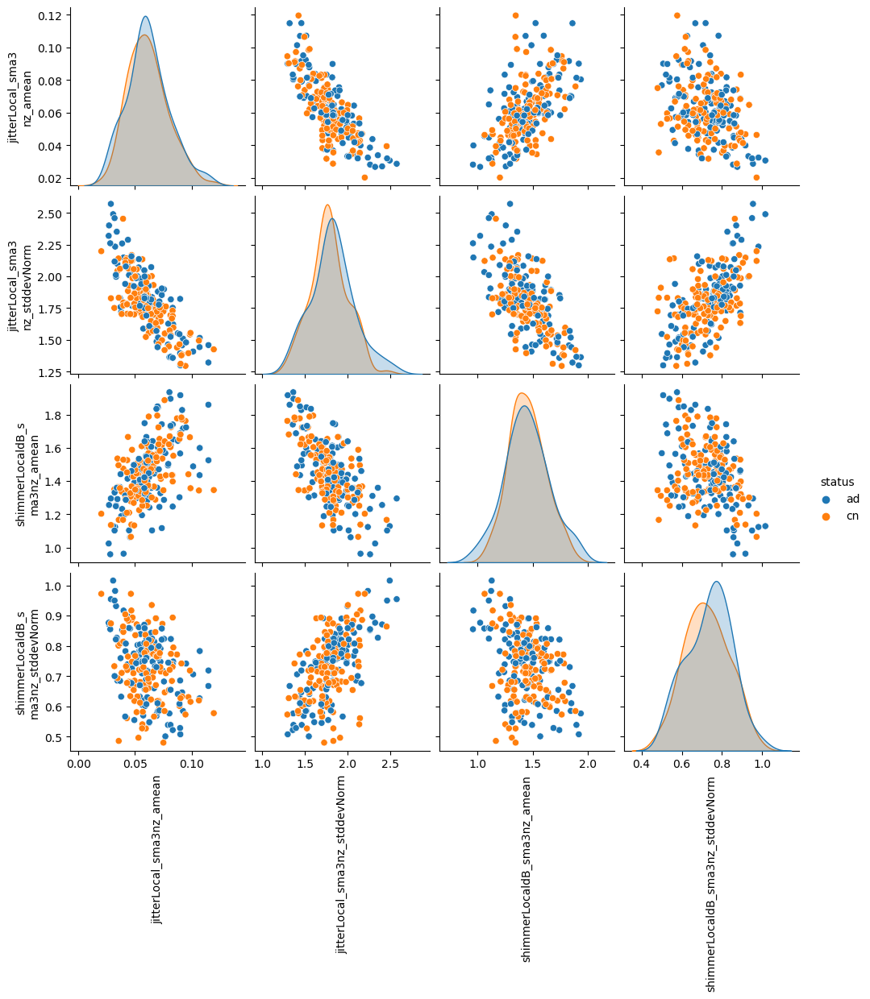

In [37]:
g = sns.pairplot(combined_data[jitter_shimmer_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate and split y axis labels
    wrap_labels(ax,16)

C:\Users\Nadun\AppData\Local\Temp\ipykernel_23528\3477105164.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(combined_data[jitter_shimmer_feature_set].corr(),cmap='viridis_r',annot=True);


Text(0.5, 1.0, 'Heat map of correlation between jitter-shimmer features')

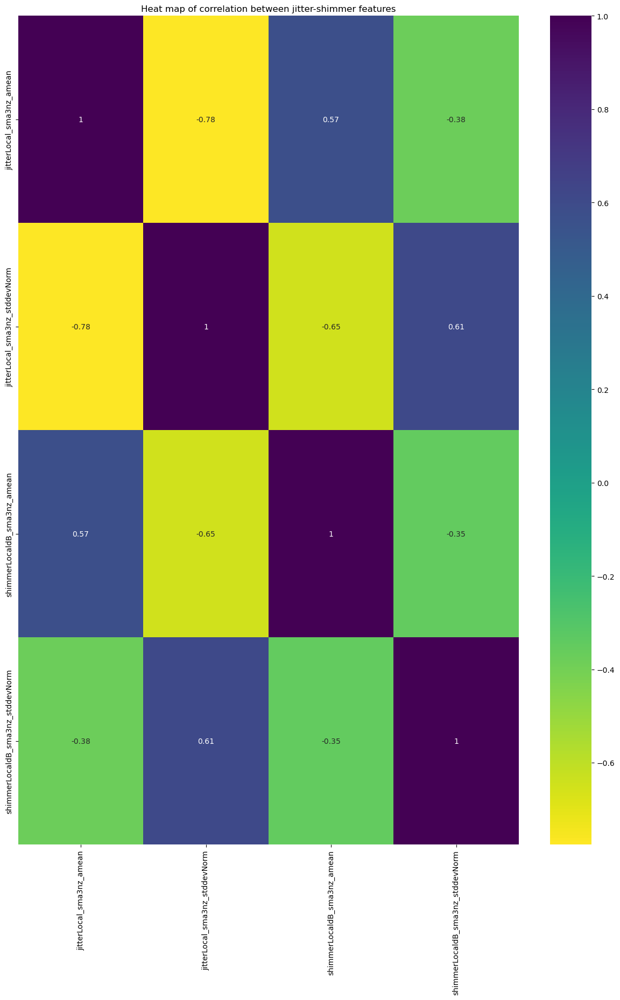

In [38]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[jitter_shimmer_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between jitter-shimmer features')

In [39]:
# New jitter-shimmer features

jitter_new = ['jitterLocal_sma3nz_stddevNorm',
 'shimmerLocaldB_sma3nz_amean']








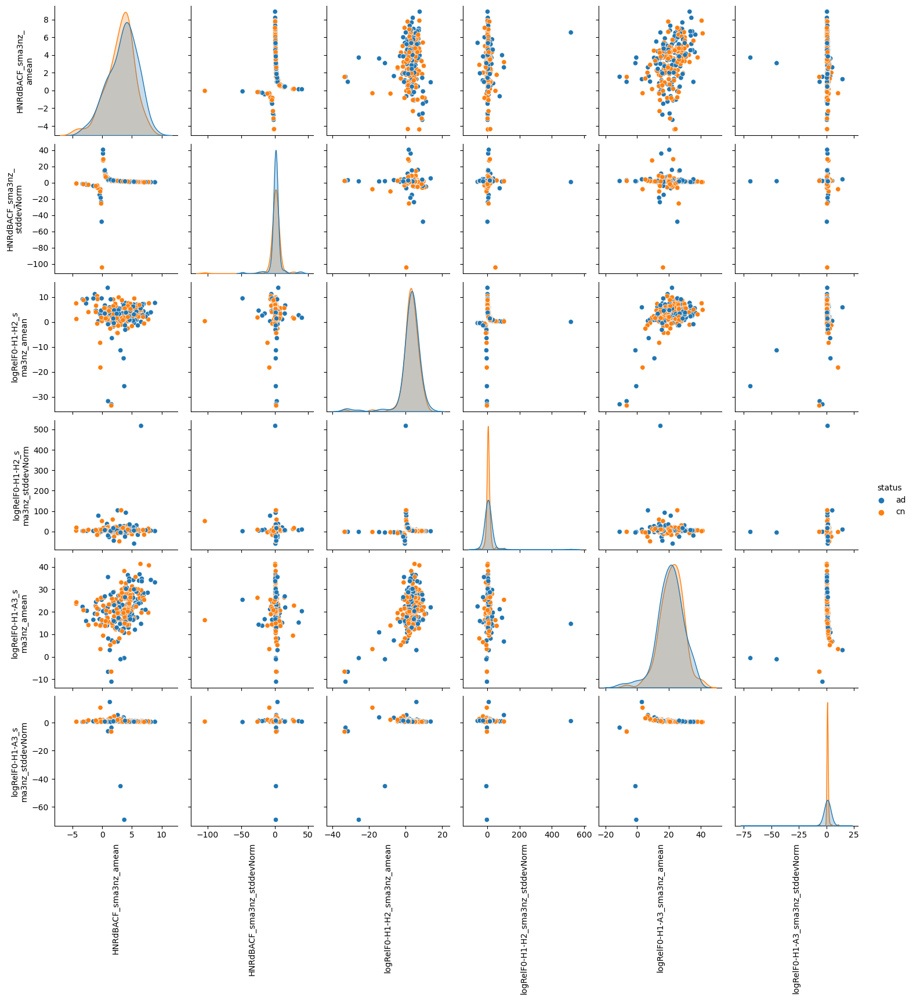

In [40]:
g = sns.pairplot(combined_data[log_rel_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate and split y axis labels
    wrap_labels(ax,16)

C:\Users\Nadun\AppData\Local\Temp\ipykernel_23528\2131391271.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(combined_data[log_rel_feature_set].corr(),cmap='viridis_r',annot=True);


Text(0.5, 1.0, 'Heat map of correlation between log-rel features')

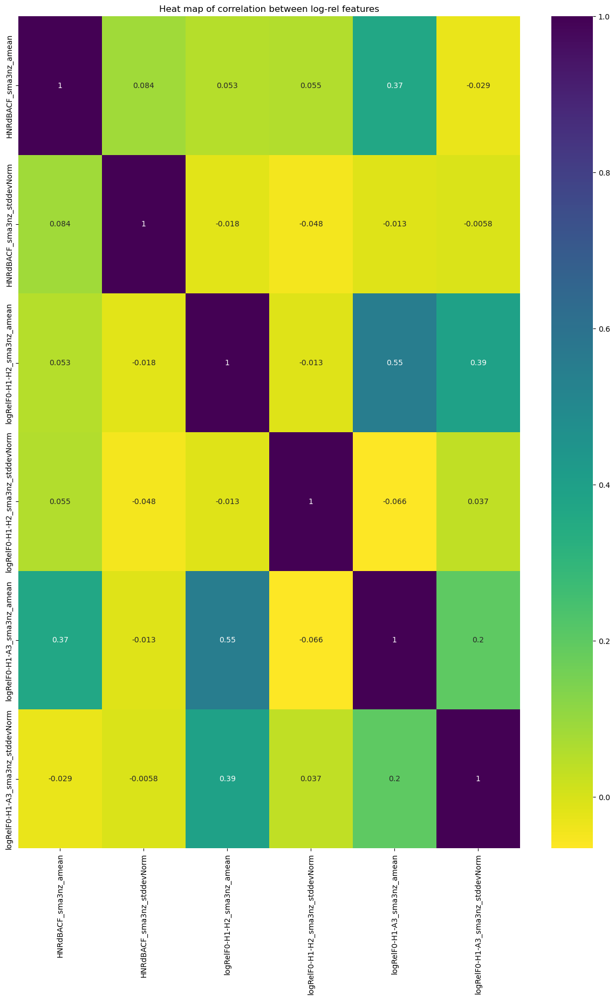

In [41]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[log_rel_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between log-rel features')

In [42]:
# Looks like a pretty independent set - so decided to keep all:

log_rel_new = ['HNRdBACF_sma3nz_amean', 'logRelF0-H1-H2_sma3nz_stddevNorm',
       'logRelF0-H1-A3_sma3nz_stddevNorm']



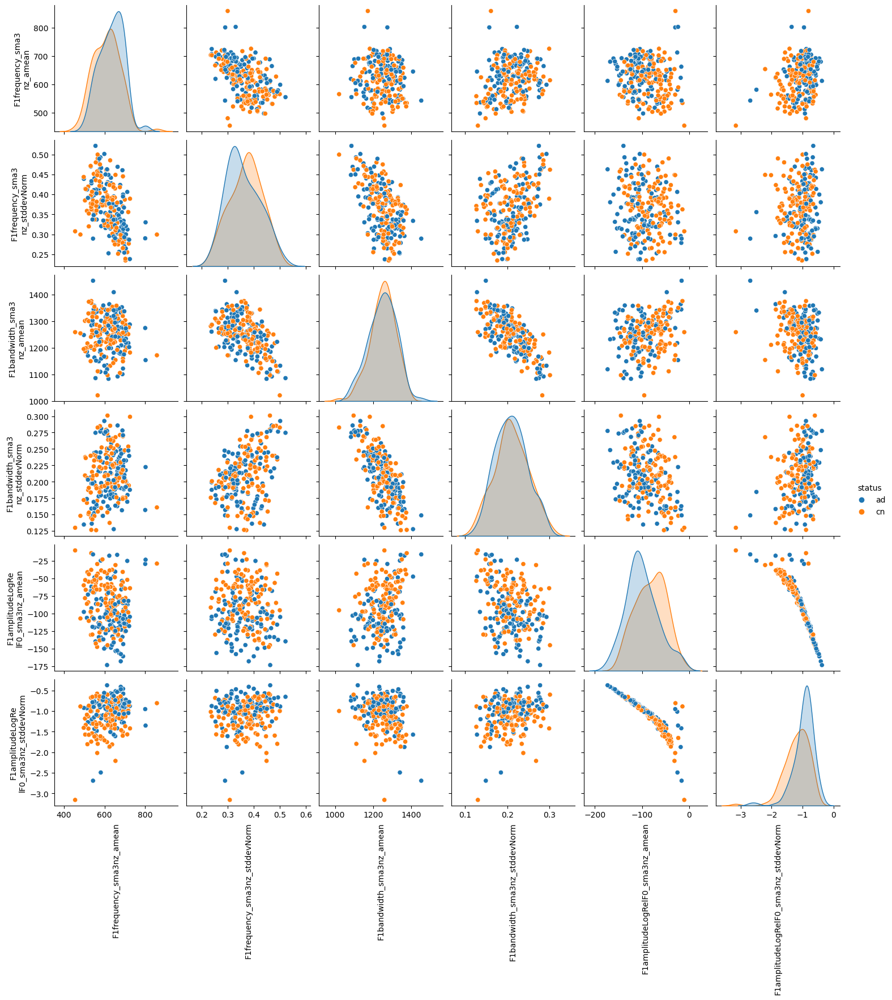

In [43]:
g = sns.pairplot(combined_data[F1_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate and split y axis labels
    wrap_labels(ax,16)

C:\Users\Nadun\AppData\Local\Temp\ipykernel_23528\390296995.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(combined_data[F1_feature_set].corr(),cmap='viridis_r',annot=True);


Text(0.5, 1.0, 'Heat map of correlation between F1 features')

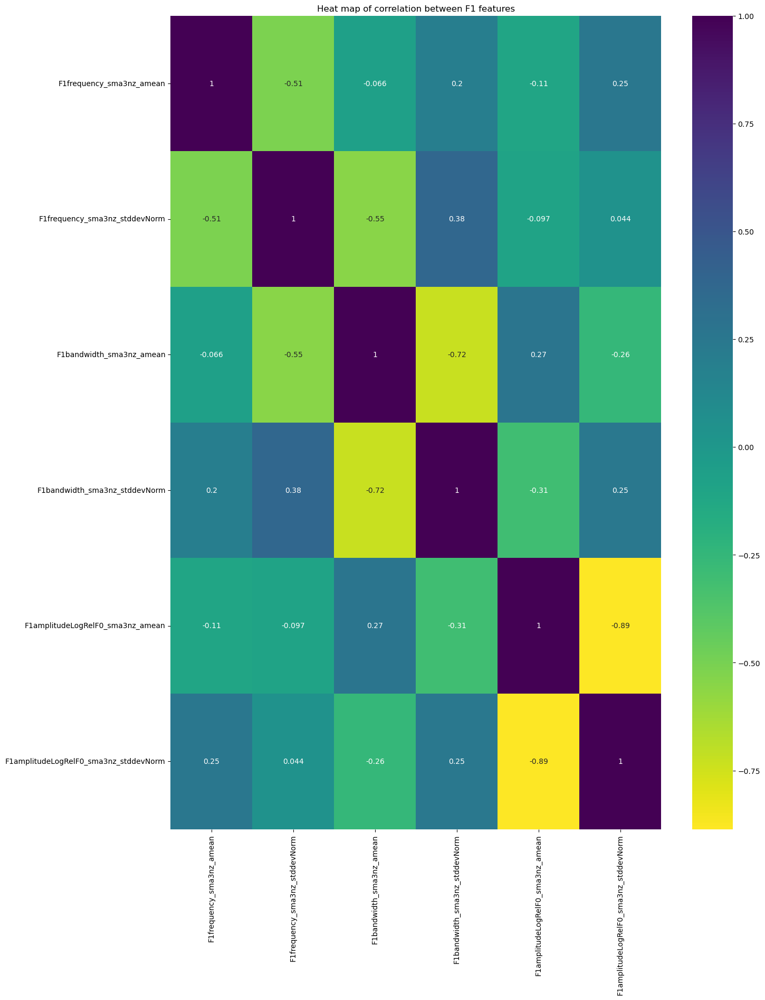

In [44]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[F1_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between F1 features')

In [45]:
# New F1 features

F1_new = ['F1frequency_sma3nz_stddevNorm','F1bandwidth_sma3nz_stddevNorm', 'F1amplitudeLogRelF0_sma3nz_amean','F1amplitudeLogRelF0_sma3nz_stddevNorm']





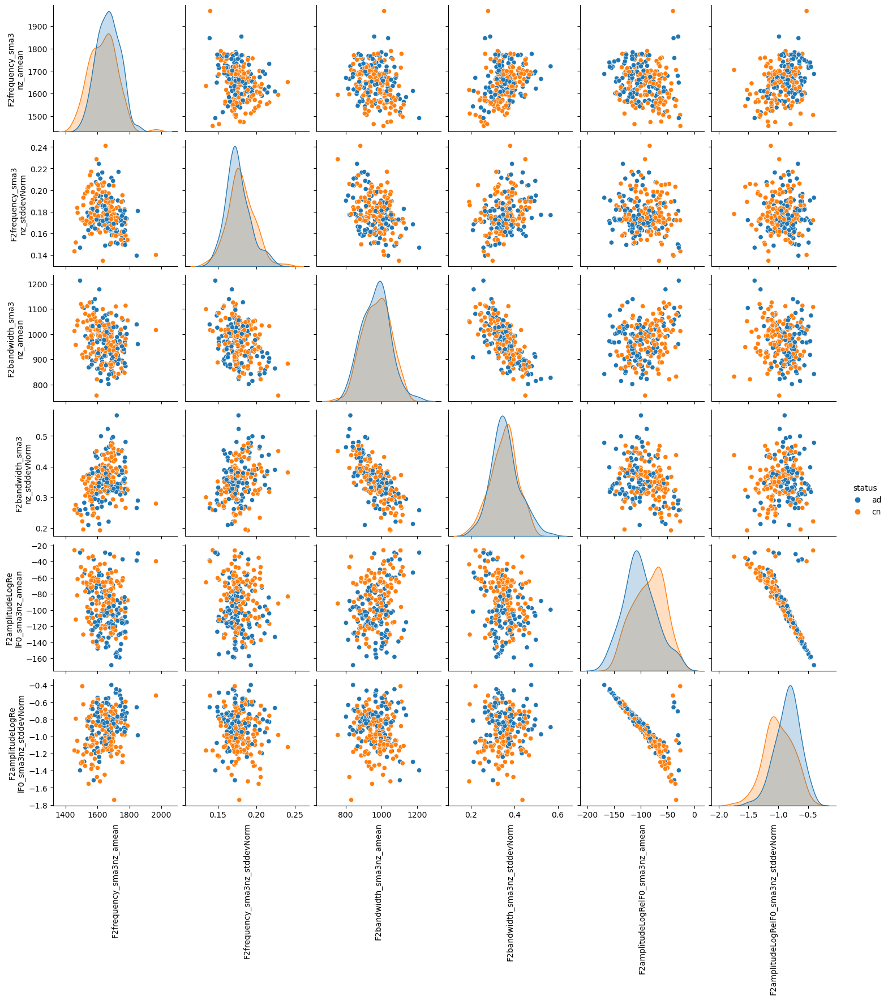

In [46]:
g = sns.pairplot(combined_data[F2_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate and split y axis labels
    wrap_labels(ax,16)

C:\Users\Nadun\AppData\Local\Temp\ipykernel_23528\332299344.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(combined_data[F2_feature_set].corr(),cmap='viridis_r',annot=True);


Text(0.5, 1.0, 'Heat map of correlation between F2 features')

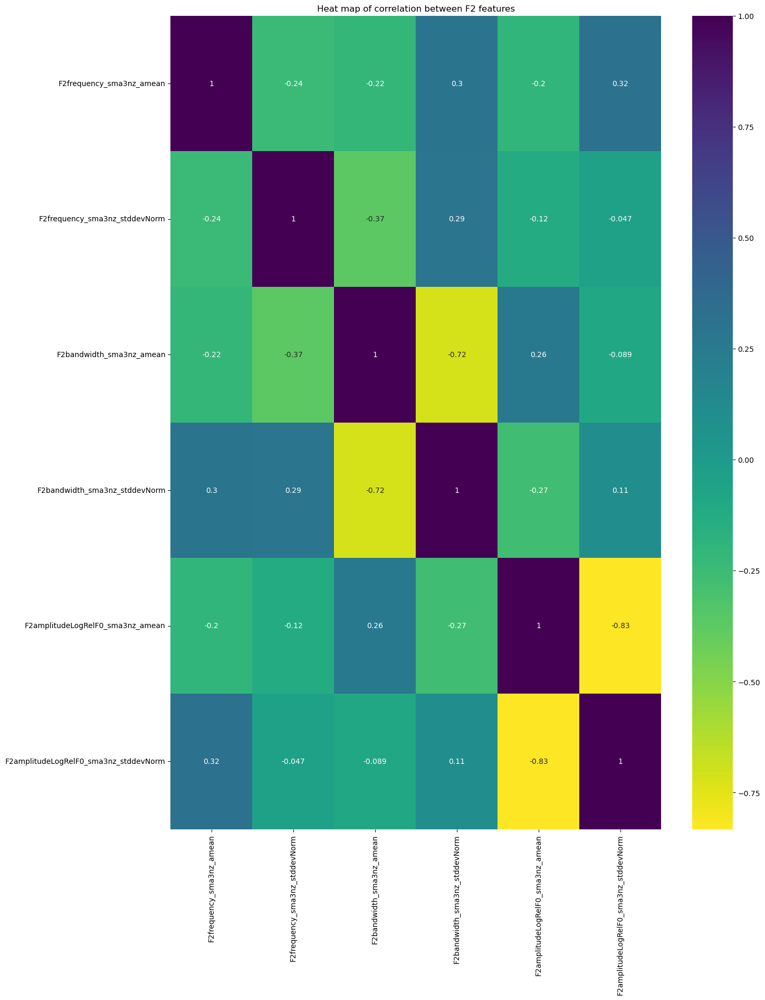

In [47]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[F2_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between F2 features')

In [48]:
# New F2 features 

F2_new = ['F2frequency_sma3nz_amean','F2amplitudeLogRelF0_sma3nz_amean','F2amplitudeLogRelF0_sma3nz_stddevNorm']





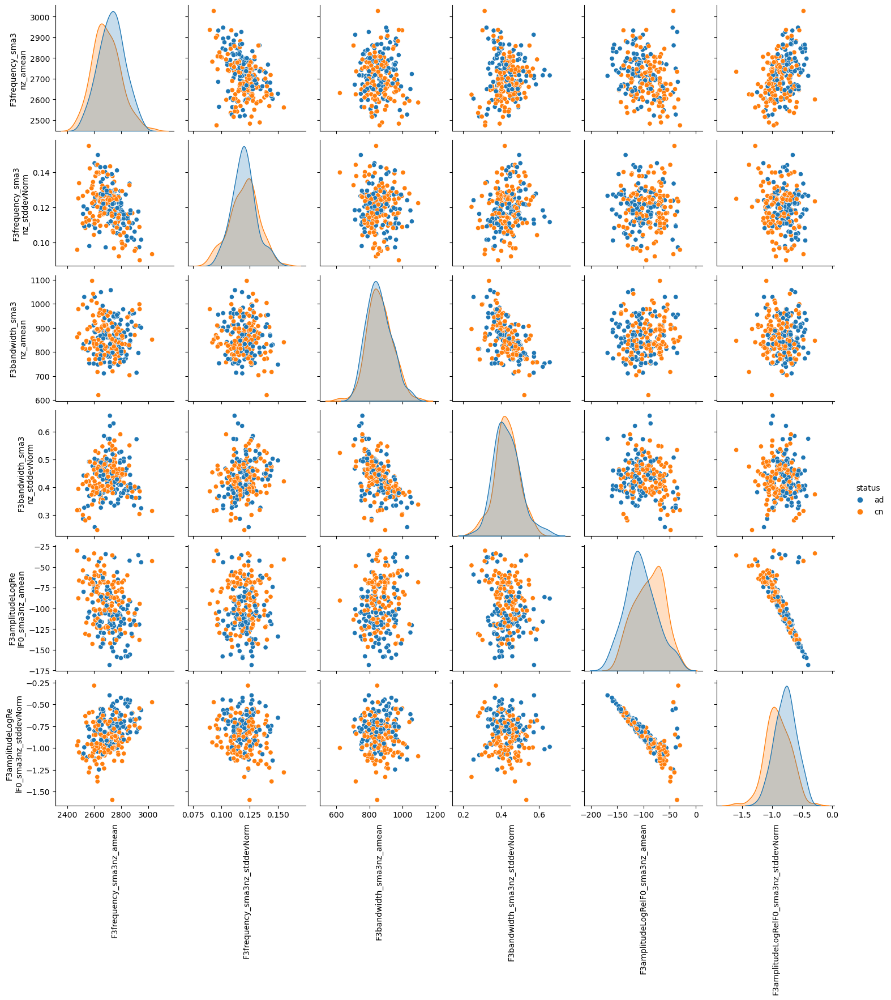

In [49]:
g = sns.pairplot(combined_data[F3_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate and split y axis labels
    wrap_labels(ax,16)

C:\Users\Nadun\AppData\Local\Temp\ipykernel_23528\300066475.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(combined_data[F3_feature_set].corr(),cmap='viridis_r',annot=True);


Text(0.5, 1.0, 'Heat map of correlation between F3 features')

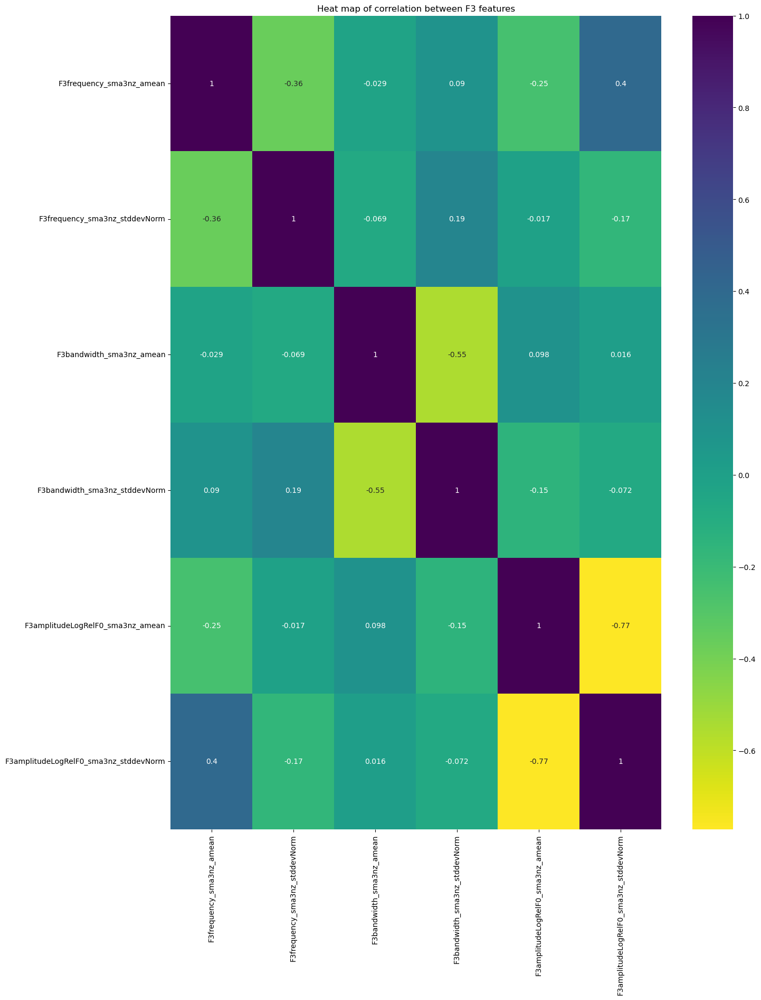

In [50]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[F3_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between F3 features')

In [51]:
# New F3 features

F3_new = ['F3frequency_sma3nz_amean',
       'F3frequency_sma3nz_stddevNorm','F3amplitudeLogRelF0_sma3nz_stddevNorm']


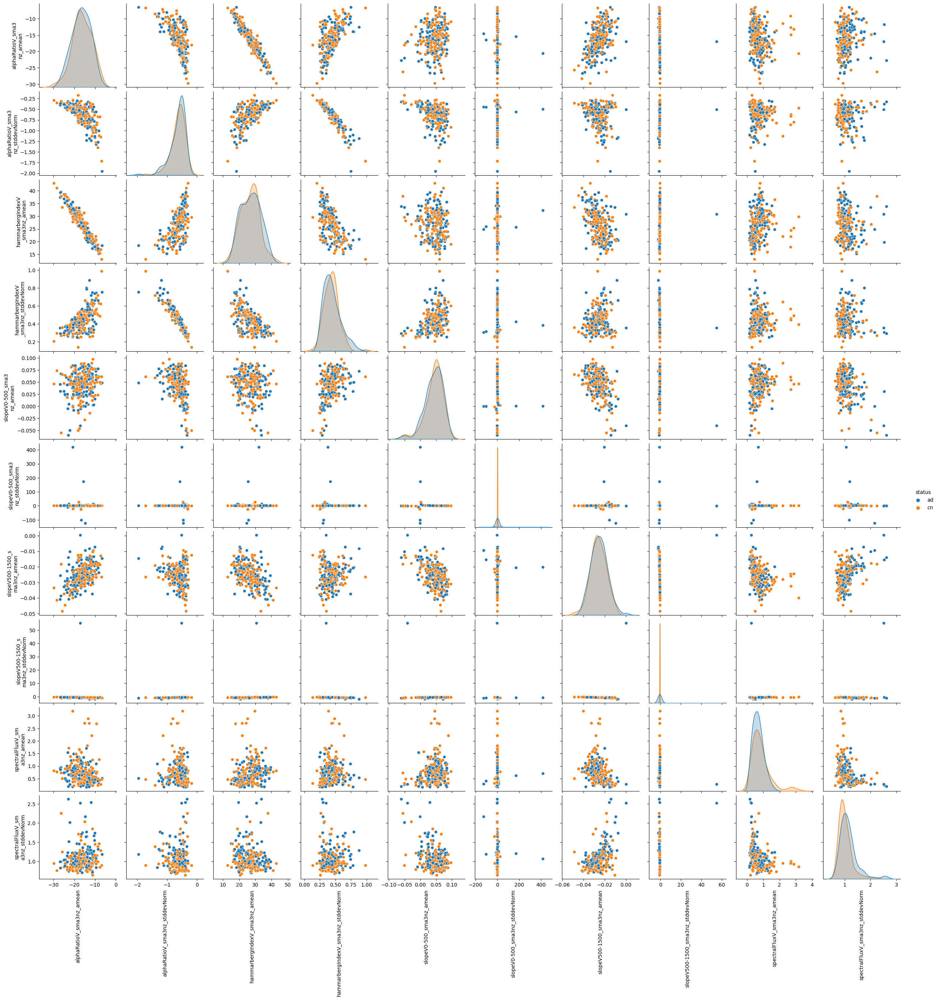

In [52]:
g = sns.pairplot(combined_data[slope_alphaV_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate and split y axis labels
    wrap_labels(ax,16)

C:\Users\Nadun\AppData\Local\Temp\ipykernel_23528\1628948135.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(combined_data[slope_alphaV_feature_set].corr(),cmap='viridis_r',annot=True);


Text(0.5, 1.0, 'Heat map of correlation between slope_alphaV features')

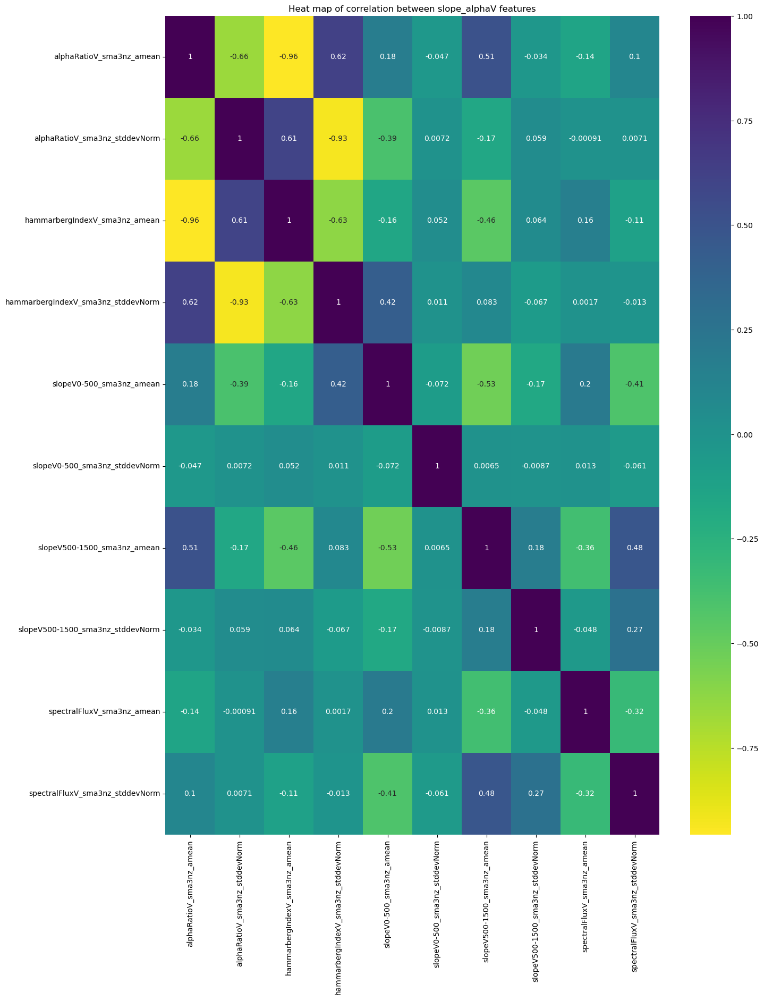

In [53]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[slope_alphaV_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between slope_alphaV features')

In [54]:

slope_alphaV_new = ['slopeV0-500_sma3nz_stddevNorm','slopeV500-1500_sma3nz_stddevNorm','spectralFluxV_sma3nz_amean',
       'spectralFluxV_sma3nz_stddevNorm']






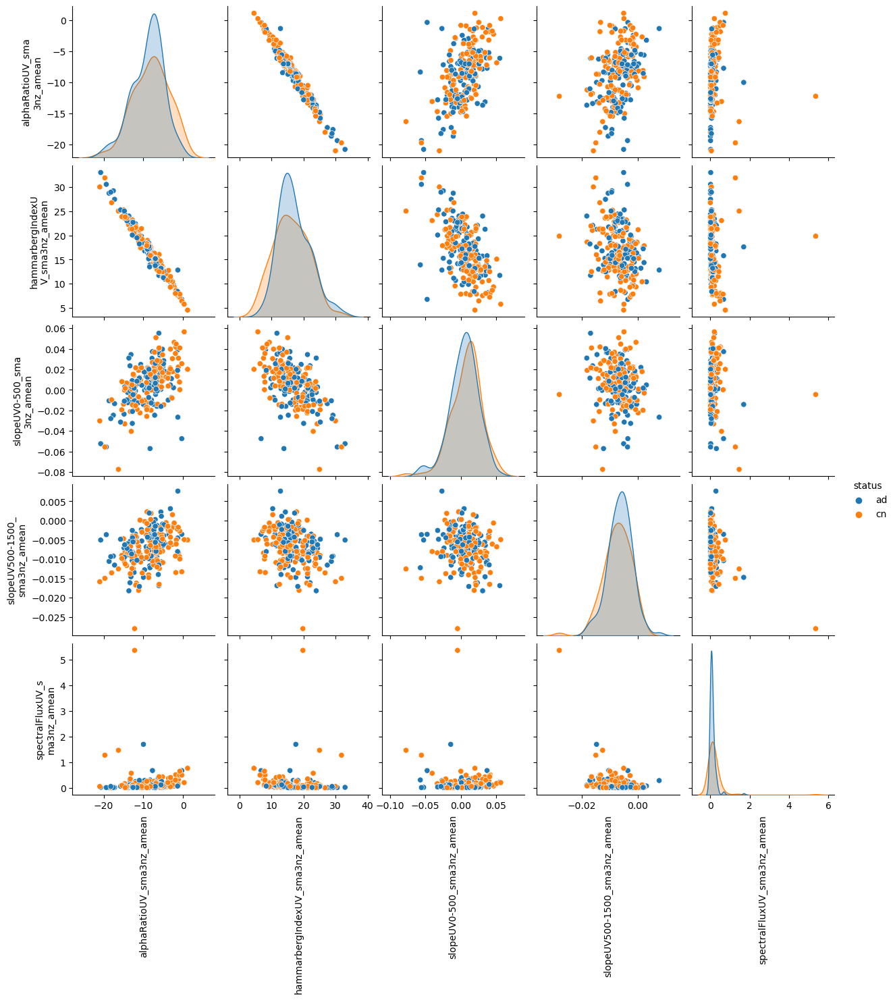

In [55]:
g = sns.pairplot(combined_data[slope_alphaUV_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate and split y axis labels
    wrap_labels(ax,16)

C:\Users\Nadun\AppData\Local\Temp\ipykernel_23528\1996604138.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(combined_data[slope_alphaUV_feature_set].corr(),cmap='viridis_r',annot=True);


Text(0.5, 1.0, 'Heat map of correlation between slope_alphaUV features')

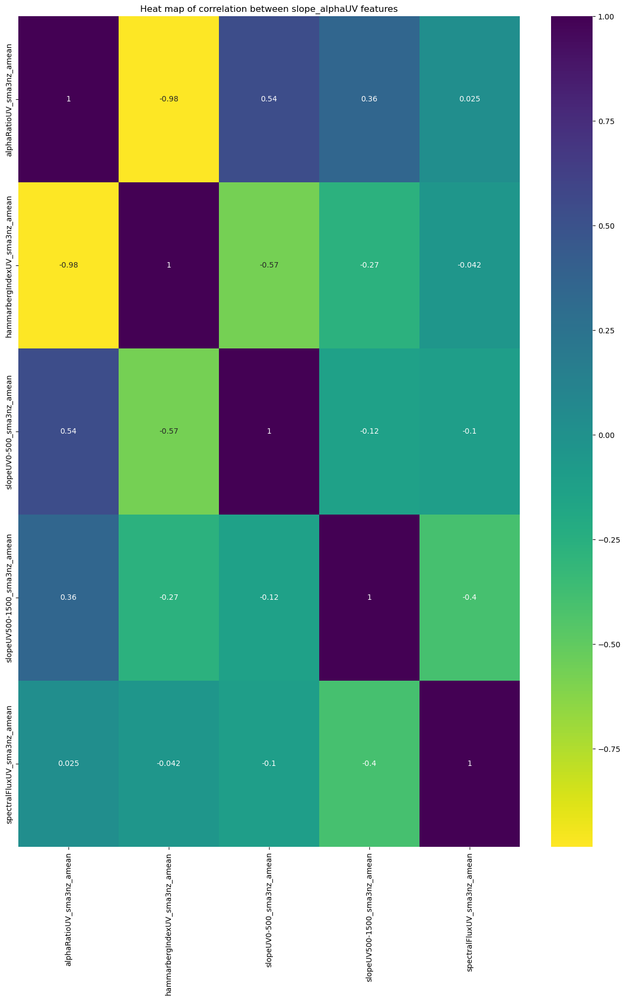

In [56]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[slope_alphaUV_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between slope_alphaUV features')

In [57]:
slope_alphaUV_new = ['spectralFluxUV_sma3nz_amean','hammarbergIndexUV_sma3nz_amean']





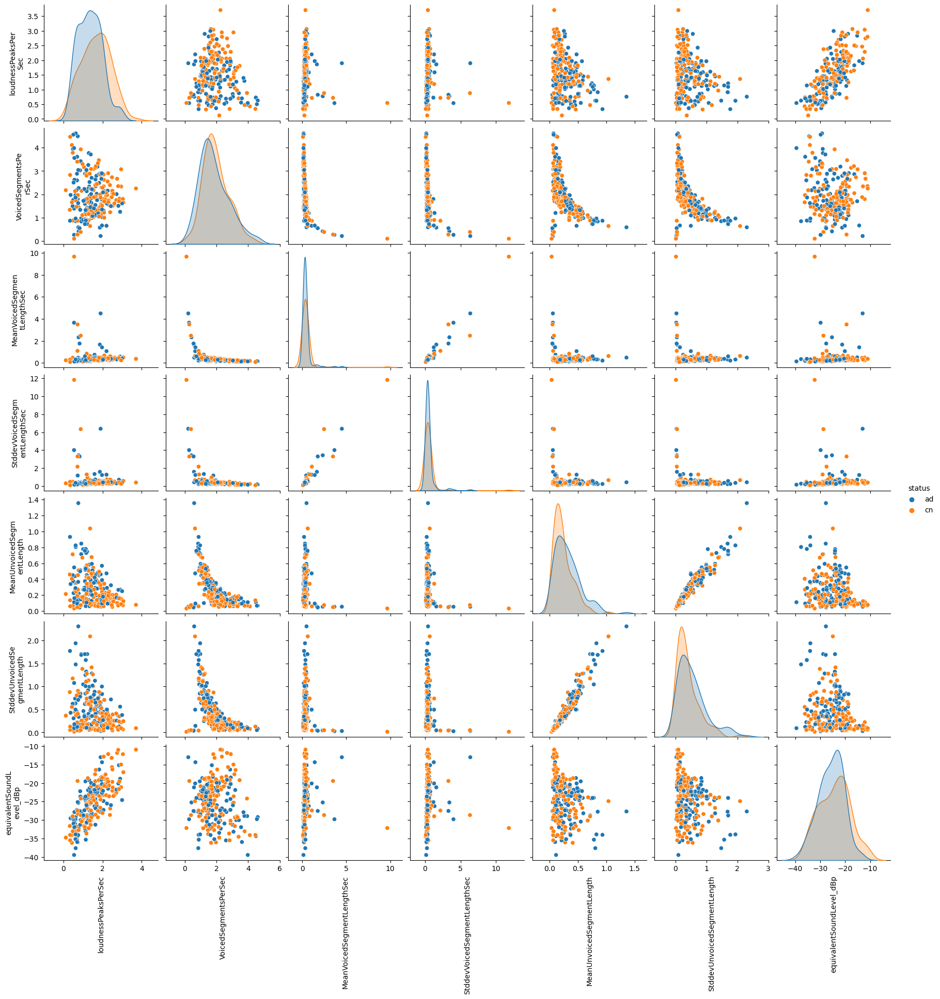

In [58]:
g = sns.pairplot(combined_data[other_features_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate and split y axis labels
    wrap_labels(ax,16)

C:\Users\Nadun\AppData\Local\Temp\ipykernel_23528\2274926652.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(combined_data[other_features_set].corr(),cmap='viridis_r',annot=True);


Text(0.5, 1.0, 'Heat map of correlation between other features')

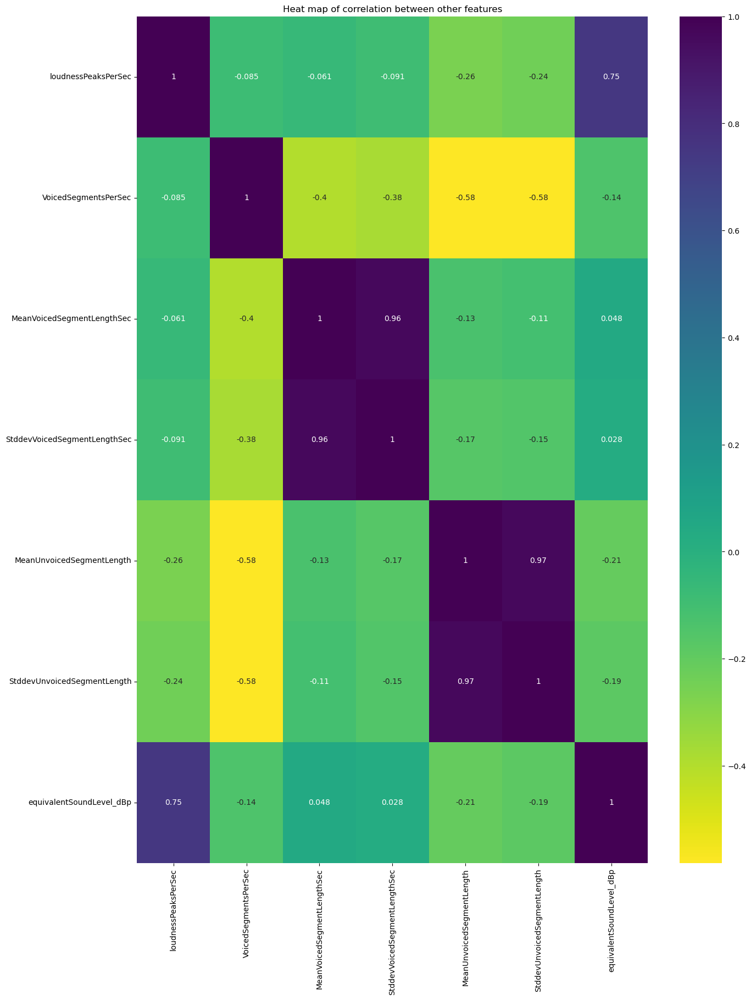

In [59]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[other_features_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between other features')

In [60]:
other_new = ['loudnessPeaksPerSec', 'MeanVoicedSegmentLengthSec', 'MeanUnvoicedSegmentLength', 'equivalentSoundLevel_dBp']


In [61]:
 kept_features = F0_new+loudness_new+spectral_flux_new + mfcc_new +jitter_new + log_rel_new + F1_new + F2_new + F3_new + slope_alphaV_new + slope_alphaUV_new + other_new 

In [62]:
len(kept_features)

42

Overall, we decided to keep 37 features.

In [63]:
df = combined_data[kept_features]
df['status'] = combined_data['status']
df.shape

C:\Users\Nadun\AppData\Local\Temp\ipykernel_23528\2578238243.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['status'] = combined_data['status']


(237, 43)

In [64]:
df.head()

,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,loudness_sma3_amean,loudness_sma3_percentile50.0,loudness_sma3_meanRisingSlope,loudness_sma3_stddevRisingSlope,loudness_sma3_meanFallingSlope,loudness_sma3_stddevFallingSlope,spectralFlux_sma3_amean,...,slopeV500-1500_sma3nz_stddevNorm,spectralFluxV_sma3nz_amean,spectralFluxV_sma3nz_stddevNorm,spectralFluxUV_sma3nz_amean,hammarbergIndexUV_sma3nz_amean,loudnessPeaksPerSec,MeanVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,equivalentSoundLevel_dBp,status
audio file,,,,,,,,,,,,,,,,,,,,,
adrso024,25.896833,7.935173,174.19131,0.549328,0.408067,7.424927,5.213052,7.055963,5.262211,0.508837,...,-0.567350,0.550346,1.225269,0.163655,21.262306,1.585821,0.733627,0.100488,-26.253954,ad
adrso025,31.419218,11.863705,276.19775,0.398178,0.238166,7.984493,9.199738,5.430153,5.992081,0.200731,...,-0.695343,0.327789,1.311078,0.069983,11.804278,0.774302,0.213387,0.221147,-32.320164,ad
adrso027,24.860962,11.135247,335.64285,0.460953,0.338455,8.206853,9.604611,5.465767,5.662509,0.207583,...,-0.940123,0.283992,1.236332,0.134296,14.144296,0.727537,0.099811,0.112874,-34.366104,ad
adrso028,27.134663,13.376965,248.23643,0.399583,0.185939,13.853819,12.248559,9.349718,8.396350,0.202821,...,-0.652363,0.235273,2.537468,0.118246,15.247038,0.482315,0.174490,0.069385,-28.948114,ad
adrso031,38.107906,22.327736,336.57800,0.358402,0.266022,5.982065,6.058165,5.824781,9.875219,0.149938,...,-0.909497,0.223593,1.312532,0.083634,14.497070,0.689995,0.171469,0.208814,-35.530070,ad


In [65]:
df.to_csv('cleaned_data_ver_2.csv')